Desarrollado por:
* María Lourdes Linares Barrera.
* Pablo Reina Jiménez.   

# 2. Extracción de características

En esta sección vamos a presentar las características que podemos extraer tanto del dominio temporal como del dominio frecuencial de un audio. En base a estas características daremos una intuición de cómo se pueden distinguir géneros musicales a nivel exploratorio/cualitativo, antes de proceder a la próxima sección donde utilizaremos modelos de aprendizaje.

## Importaciones

In [1]:
import librosa

import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

import IPython.display as ipd
import pandas as pd
import os
import csv

___

## 2.1. Algunos conceptos previos

### 2.1.1. Dominios de una señal: temporal y frecuencial.

Cuando analizamos una señal de audio, podemos hacerlo desde dos perspectivas principales: el dominio temporal y el dominio frecuencial. Cada uno de estos dominios nos brinda diferentes tipos de información sobre el audio.

* **Dominio temporal: tiempo vs amplitud**

    Cuando analizamos el dominio temporal de una señal estamos analizando cómo varía la amplitud de la señal de audio a lo largo del tiempo ("la intensidad de la señal en cada momento"). En este caso:
    * **Eje X - tiempo**. El eje horizontal representa el avance temporal medido en segundos.
    * **Eje Y - amplitud**. El eje vertical representa la amplitud de la señal, es decir, la desviación de la onda con respecto al eje central. En el dominio temporal se mide como un valor sin dimensiones (adimensional) que oscila entre -1 y 1 en formatos normalizados o como una señal de número entero (por ejemplo, entre -32768 y 32767 señales para 16-bit) en formatos no normalizados. Representa la fuerza o intensidad de la señal.

* **Dominio frecuencial: frecuencia vs magnitud**

    Cuando analizamos el dominio frecuencial de una señal, estamos analizando la magnitud de cada frencuencia de la señal. En este caso:

    * **Eje X - frecuencia.** El eje horizontal representa las frecuencias presentes en la señal, medidas en Hertz (Hz). 
    * **Eje Y - magnitud/amplitud.** El eje vertical representa la magnitud de cada frecuencia. Es el módulo del número complejo que representa la contribución de cada frecuencia a la señal global.

Este gráfico representa de forma clara la dicotomía entre ambos dominios:

<img src="img/NB2_timeFreqDomain.png" width="600"/>

*Figura: Dominio temporal vs dominio frecuencial. Fuente: [[1]](https://studyelectrical.com/2023/05/time-domain-analysis-vs-frequency-domain-analysis.html)*

Veamos a continuación un ejemplo práctico utilizando un audio de ejemplo del corpus CCMUSIC:

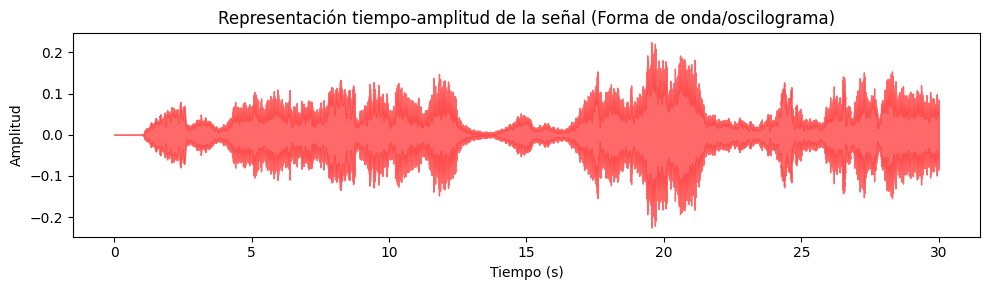

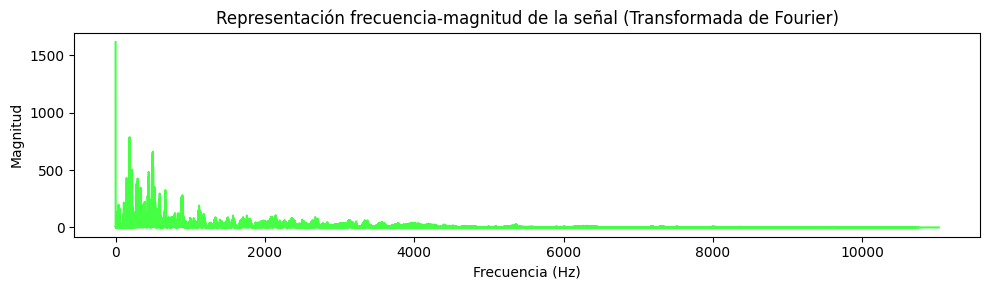

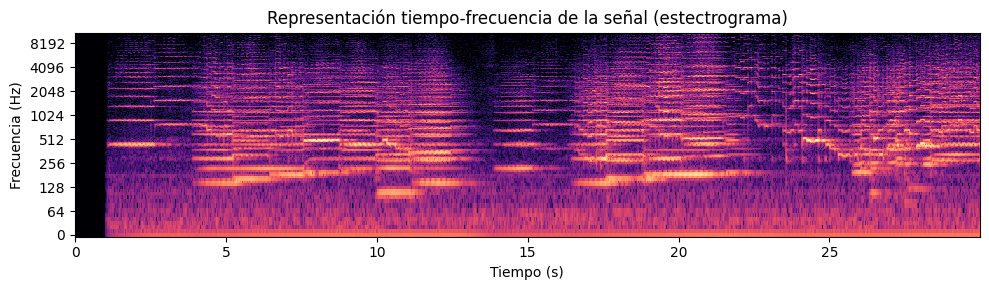

In [2]:
file_ejemplo = "ccmusic/train/audios/audio_train_653.wav"
audio, sr = librosa.load(file_ejemplo, sr=None, mono=True)

# Reproducir el audio
ipd.display(ipd.Audio(audio, rate=sr))

# Dominio temporal
plt.figure(figsize=(10, 3))
librosa.display.waveshow(audio, sr=sr, color="#f44", alpha=0.8)
plt.title("Representación tiempo-amplitud de la señal (Forma de onda/oscilograma)")
plt.xlabel("Tiempo (s)")
plt.ylabel("Amplitud")
plt.tight_layout()
plt.show()

# Dominio frecuencial
fft = np.fft.fft(audio)
frequencies = np.fft.fftfreq(len(fft), 1/sr) # *** Explicación abajo ***
magnitude = np.abs(fft)

plt.figure(figsize=(10, 3))
plt.plot(frequencies[:len(frequencies)//2], magnitude[:len(frequencies)//2], color="#4f4") # Representamos solo la mitad dado que el gráfico es simétrico
plt.title("Representación frecuencia-magnitud de la señal (Transformada de Fourier)")
plt.xlabel("Frecuencia (Hz)")
plt.ylabel("Magnitud")
plt.tight_layout()
plt.show()

# Frecuencia + tipo
D = np.abs(librosa.stft(audio))
plt.figure(figsize=(10, 3))
librosa.display.specshow(librosa.amplitude_to_db(D, ref=np.max), sr=sr, x_axis='time', y_axis='log')
plt.title("Representación tiempo-frecuencia de la señal (estectrograma)")
plt.xlabel("Tiempo (s)")
plt.ylabel("Frecuencia (Hz)")
plt.tight_layout()
plt.show()

# *** Explicación ***
# np.fft.fftfreq genera un array de frecuencias que corresponde a los componentes de la transformada de Fourier.
# El primer argumento es la longitud de la transformada (igual a la longitud de la señal original).
# El segundo argumento, 1/sr, es el intervalo de tiempo entre muestras, que es el inverso de la tasa de muestreo (sr).
# Esto produce un array de frecuencias que se corresponde con los índices del resultado de np.fft.fft, permitiendo
# visualizar el espectro de frecuencias en Hertz.# 

### 2.1.2. Segmentación en bloques

La segmentación en bloques consiste en descomponer la señal en bloques temporales, también llamados *frames*, lo que permite simplificar y mejorar la eficiencia del análisis de la señal. La descomposición de la señal en bloques se realiza de la siguiente forma.

Matemáticamente, la descomposición de la señal en bloques queda formulada de la siguiente forma. Sean: 

- Una señal $s$ compuesta por muestras $s_i$ ($i = 0, \ldots, N - 1$) recogidas a una frecuencia de muestreo $sr$, donde cada muestra es tomada en el instante temporal $t_i = \frac{i}{sr}$.

- Un tamaño de bloque $F \geq 1$ (número de muestras que contiene cada bloque) y un *hop* o separación $H \leq F$ (salto entre el inicio de un bloque y el inicio del siguiente).

Entonces, el bloque $k$-ésimo comprende desde $s_{H \cdot k}$ hasta $s_{H \cdot k + F - 1}$. Es decir, comienza en $t = \frac{H \cdot k}{sr}$ y finaliza en $t = \frac{H \cdot k + F - 1}{sr}$.

El siguiente gráfico ilustra gráficamente el proceso de segmentación de una señal de audio.

<img src="img/NB2_framing.png" width="600"/>

*Figura: Segmentación de una señal en bloques. Fuente:* [[2]](https://www.researchgate.net/publication/332553888_End-to-End_Environmental_Sound_Classification_using_a_1D_Convolutional_Neural_Network/figures?lo=1&utm_source=google&utm_medium=organic)

Algunas observaciones que vale la pena resaltar:

- Solapamiento: Si $H < F$, existe un solapamiento entre frames consecutivos, lo que ayuda a preservar la continuidad/contexto entre los segmentos analizados. Si $H=F$ los bloques son consecutivos y no presentan solape.
- Número total de bloques ($T$): Si $N$ es el tamaño de la señal y consideramos saltos de longitud $H$, tendríamos $T = \lfloor \frac{N}{H} \rfloor$ bloques. Si el número de muestras no es múltiplo del salto el último bloque quedaría incompleto. En estas situaciones, podríamos definir $T = \lfloor \frac{N-F}{H} + 1 \rfloor$ donde podríamos perder el final de la señal pero todos los bloques mantendrían la misma longitud.

____

## 2.2. Características del dominio temporal y frecuencial

Para esta sección y la siguiente sección utilizaremos estos audios del corpus CCMUSIC como ejemplo ilustrativo de la explicación de las características.

In [10]:
# Carga de datos de anotaciones y selección de un audio por jerarquía
np.random.seed(20)

# Jerarquía 1: Classic vs Non_classic

anotaciones_jerarquia1 = pd.read_csv('ccmusic/train/annotations.csv')
seleccionados_jerarquia1 = [group.sample(1) for _, group in anotaciones_jerarquia1.groupby('label_name')]
seleccionados_jerarquia1 = pd.concat(seleccionados_jerarquia1).reset_index(drop=True)
audios_ejemplo_jerarquia1 = [
    (fila['audio_file'], fila['label_name']) for _, fila in seleccionados_jerarquia1.iterrows()
]
print("Audios de ejemplo de la jerarquía fst_level_label \n", audios_ejemplo_jerarquia1)

for file, label in audios_ejemplo_jerarquia1:
    print(f"{label}: {file}")
    display(ipd.Audio(file, autoplay=True))

Audios de ejemplo de la jerarquía fst_level_label 
 [('ccmusic/train/audios/audio_train_983.wav', 'Classic'), ('ccmusic/train/audios/audio_train_1082.wav', 'Non_classic')]
Classic: ccmusic/train/audios/audio_train_983.wav


Non_classic: ccmusic/train/audios/audio_train_1082.wav


### 2.2.1. Características del dominio temporal

Las características más interesantes que podemos extraer del dominio temporal de una señal son: su envolvente, la raíz cuadrada media y la tasa de cruce del eje 0. Estas características se basan en analizar distintos aspectos del oscilograma.

* **Amplitude Envelope (AE)**:
    - Intuitivamente, la envolvente de una señal representa el "borde del oscilograma". Permite visualizar de una forma más intuitiva cómo varía la intensidad de la señal a lo largo del tiempo.

    - La envolvente de amplitud es útil para evaluar cómo varía la energía de la señal con el tiempo, lo que es importante para tareas como la detección de eventos, la segmentación y el análisis del ritmo en música o audio.
    
    - Sea señal de audio agrupada en $T$ *frames* o bloques temporales $(k=0,...,T-1)$ de tamaño $F$, con desplazamiento o *hop* $H$.   
        Para cada *frame* $K$ se calcula su $AE_k$ como se toma el máximo valor de amplitud:
        $$AE_k = \max_{i=kH}^{kH+F - 1} s(i)$$        
        donde $AE_k$ es la envolvente del *frame* $k$, $F$ es el tamaño de *frame*, $H$ es el *hop*, y $s(i)$ es la amplitud de la señal en el índice $i$.

In [4]:
def amplitude_envelope(signal,frame_size=1024,hop_length=512):
    F=frame_size                                                    # Tamaño de frame
    H=hop_length                                                    # Número de muestras que se desplazan al avanzar de un bloque al siguiente.
    N=signal.shape[0]                                               # Número de muestras en la señal
    return np.array([max(signal[k:k+F]) for k in range(0, N, H)])   # Para cada frame k se calcula el máximo de la amplitud de la señal en ese frame

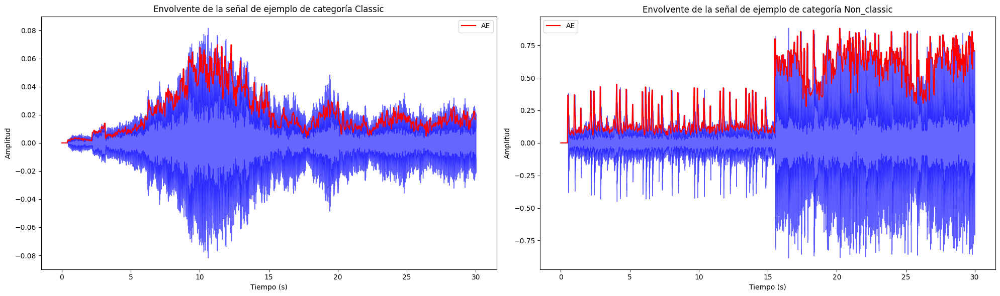

In [5]:
FRAMES_SIZE = 1024
HOP_LENGTH = 512
SR = 22050

fig, ax = plt.subplots(1, 2, figsize=(20, 6))

for i, (file, label) in enumerate(audios_ejemplo_jerarquia1):

    signal, sr = librosa.load(file, sr=None, mono=True)
    ae_signal = amplitude_envelope(signal, FRAMES_SIZE, HOP_LENGTH)
    frames = range(0, len(ae_signal))  
    t = librosa.frames_to_time(frames, hop_length=HOP_LENGTH, sr=SR)

    librosa.display.waveshow(signal, sr=22050, alpha=0.6, color="b", ax=ax[i])
    ax[i].plot(t, ae_signal, color="red", label="AE")
    ax[i].set_title(f"Envolvente de la señal de ejemplo de categoría {label}")
    ax[i].set_xlabel("Tiempo (s)")
    ax[i].set_ylabel("Amplitud")
    ax[i].legend()

plt.tight_layout()
plt.show()

* **RMS (Root Mean Square)**:

    - La RMS de una señal sirve para estimar la energía de la señal en distintos puntos del tiempo, lo que puede ayudar a detectar silencios y la dinámica de la señal.

    - La RMS es útil para identificar momentos de mayor o menor energía en una grabación, siendo especialmente relevante en aplicaciones como detección de pausas o eventos. 
    
    - Sea $s$ una señal segmentada en $T$ *frames* o bloques temporales $(k=0,...,T-1)$ de tamaño $F$, con desplazamiento o *hop* $H$.   
        Para cada *frame* $k$ calculamos su $RMS_k$ como:
        $$RMS_k=\sqrt{\frac{1}{F} \cdot \sum_{i=k \cdot F}^{(k+1)\cdot F-1}{s(i)^2}}$$  
        donde $s(i)$ representa la amplitud de la señal en el instante i.


In [6]:
def calculate_rms(signal, frame_size=1024, hop_length=512):
    rms = librosa.feature.rms(y=signal, frame_length=frame_size, hop_length=hop_length)[0]
    return rms

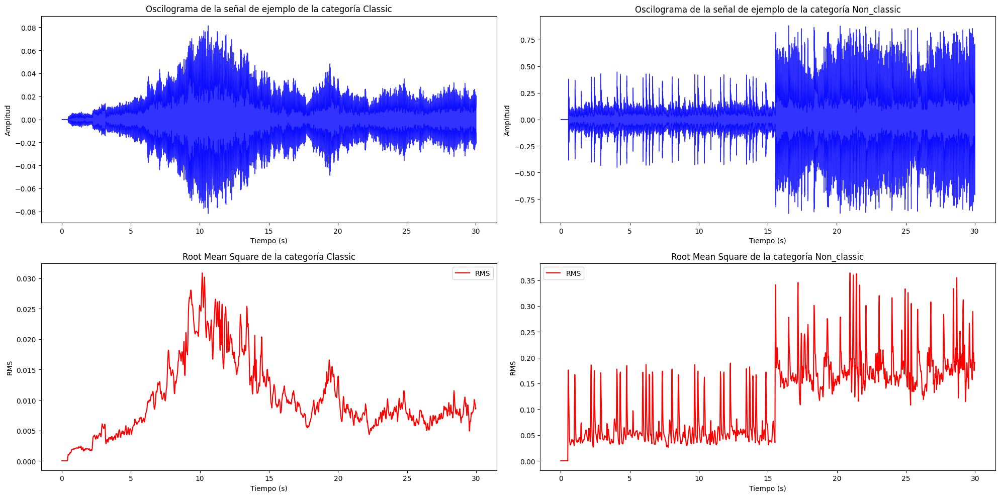

In [7]:
FRAMES_SIZE = 1024
HOP_LENGTH = 512
SR = 22050

fig, ax = plt.subplots(2, 2, figsize=(20, 10))

for i, (file, label) in enumerate(audios_ejemplo_jerarquia1):

    signal, sr = librosa.load(file, sr=None, mono=True)
    rms_signal = calculate_rms(signal, FRAMES_SIZE, HOP_LENGTH)
    frames = range(0, len(rms_signal))  
    t = librosa.frames_to_time(frames, hop_length=HOP_LENGTH, sr=SR)

    # Oscillogram
    librosa.display.waveshow(signal, sr=SR, alpha=0.8, color="b", ax=ax[0, i])
    ax[0, i].set_title(f"Oscilograma de la señal de ejemplo de la categoría {label}")
    ax[0, i].set_xlabel("Tiempo (s)")
    ax[0, i].set_ylabel("Amplitud")

    # RMS
    ax[1, i].plot(t, rms_signal, color="red", label="RMS")
    ax[1, i].set_title(f"Root Mean Square de la categoría {label}")
    ax[1, i].set_xlabel("Tiempo (s)")
    ax[1, i].set_ylabel("RMS")
    ax[1, i].legend()

plt.tight_layout()
plt.show()

* **ZCR (Zero Crossing Rate)**:

    - La ZCR mide cuantas veces la señal de audio cruza el eje horizontal respecto a la longitud total de la señal, es decir, cuantas veces la amplitud pasa de negativa a positiva o viceversa.

    - La ZCR es útil para distinguir clasificar sonidos en diferentes categorías, como voz o música y distinguir entre distintos tipos de ritmos.

    - Para calcular la ZCR de una señal segmentada en $T$ bloques ($k=1,..,T-1$) de tamaño $F$.

        Para cada *frame* su $ZCR_k$ se calcula como:
        $$ZCR_k=\sum_{i=k \cdot F}^{(k+1)\cdot F-1} \frac{1}{2} | \text{sgn($s(i)$)- sgn($s(i+1)$)}  |$$
        donde $s(i)$ es la amplitud de la señal en el instante $i$ y la función signo se define como
        $$ \text{sgn($z$)}=\begin{Bmatrix} 
        1  &  z>0 \\
        0  &  z=0 \\
        -1 &  z<0
        \end{Bmatrix}$$
        El resultado para cada bloque puede ser normalizado $ZCR_k/F$ para que sus valores estén entre $[0,1]$.

In [8]:
def calculate_zcr(signal, frame_size=1024, hop_length=512):
    zcr = librosa.feature.zero_crossing_rate(y=signal, frame_length=frame_size, hop_length=hop_length)[0]
    return zcr

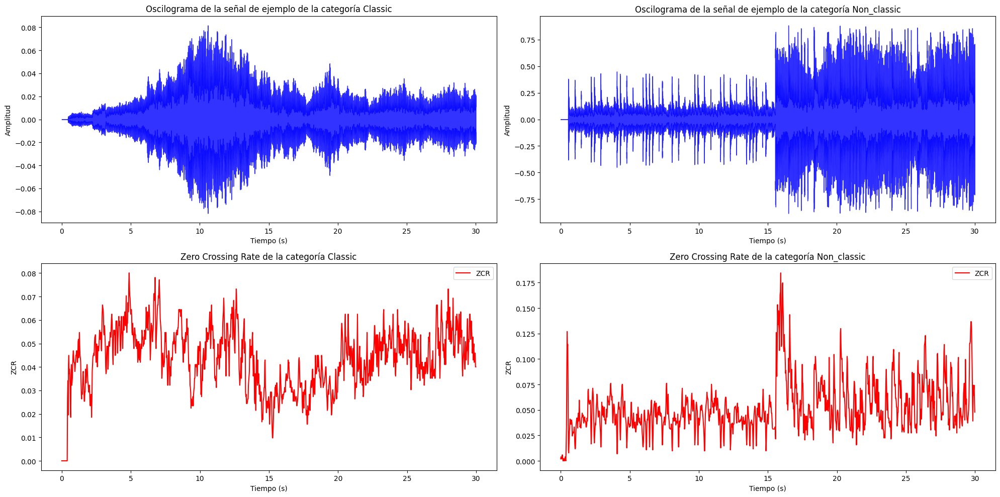

In [9]:
FRAMES_SIZE = 1024
HOP_LENGTH = 512
SR = 22050

fig, ax = plt.subplots(2, 2, figsize=(20, 10))

for i, (file, label) in enumerate(audios_ejemplo_jerarquia1):

    signal, sr = librosa.load(file, sr=None, mono=True)
    rms_signal = calculate_zcr(signal, FRAMES_SIZE, HOP_LENGTH)
    frames = range(0, len(rms_signal))  
    t = librosa.frames_to_time(frames, hop_length=HOP_LENGTH, sr=SR)

    # Oscillogram
    librosa.display.waveshow(signal, sr=SR, alpha=0.8, color="b", ax=ax[0, i])
    ax[0, i].set_title(f"Oscilograma de la señal de ejemplo de la categoría {label}")
    ax[0, i].set_xlabel("Tiempo (s)")
    ax[0, i].set_ylabel("Amplitud")

    # ZCR
    ax[1, i].plot(t, rms_signal, color="red", label="ZCR")
    ax[1, i].set_title(f"Zero Crossing Rate de la categoría {label}")
    ax[1, i].set_xlabel("Tiempo (s)")
    ax[1, i].set_ylabel("ZCR")
    ax[1, i].legend()

plt.tight_layout()
plt.show()

### 2.2.2. Características del dominio frecuencial

* **Band Energy Ratio (BER)**
    - Intuitivamente, el BER (relación de energía entre bandas) compara cuánta energía hay en los sonidos graves en comparación con los sonidos agudos de una señal. Compara la energía acumulada en las frecuencias bajas frente a las frecuencias altas.

    - Es útil para distinguir audios conversacionales de no conversacionales.

    - Sea una señal dividida en $T$ bloques temporales o *frames* $(k=0, \ldots, T-1)$.   
        Para cada *frame* podemos calcular su $BER_k$:
        
        1. Calculamos la energía de la banda baja: $\text{Energía banda baja}_k = \sum_{n=0}^{FR-1} m_k(n)^2$.
        2. Calculamos la energía de la banda alta: $\text{Energía banda alta}_k = \sum_{n=FR}^{N} m_k(n)^2$.
        3. Tomamos el cociente para obtener el $BER_k$ del *frame* $k$:  
            $$\text{BER}_k = \frac{\text{Energía banda baja}_k}{\text{Energía banda alta}_k} = \frac{\sum_{n=0}^{FR-1} m_k(n)^2}{\sum_{n=FR}^{N} m_k(n)^2}$$

        donde $FR$ representa la frecuencia umbral de separación de franjas frecuenciales altas y bajas, $k$ representa el *frame* y $m_k(n)$ es el valor de la magnitud de la frecuencia $n$ en el *frame* $k$.

In [10]:
def calculate_ber(signal, split_freq, sample_rate, frame_size=1024, hop_length=512):

    # 1. Cálculo del estectrograma
    spec = librosa.stft(signal, n_fft=frame_size, hop_length=hop_length)        # Calcular el estectrograma de la señal
    modified_spec = np.abs(spec).T                                              # Convertir las magnitudes de números complejos a valor absoluto

    # 2. Determinar los límites de las bandas de frecuencia
    range_of_freq = sample_rate / 2
    change_per_bin = range_of_freq / spec.shape[0]
    split_freq_bin = int(np.floor(split_freq / change_per_bin))

    # 3. Calcular el BER para cada frame
    res = []
    for sub_arr in modified_spec:

        # Densidad de energía para las frecuencias bajas
        low_freq_density = sum(i ** 2 for i in sub_arr[:split_freq_bin])
        # Densidad de energía para las frecuencias altas
        high_freq_density = sum(i ** 2 for i in sub_arr[split_freq_bin:])
        high_freq_density = high_freq_density if high_freq_density > 0 else 1e-10

        # Calcular cociente
        ber_val = low_freq_density / high_freq_density
        res.append(ber_val)

    return np.array(res)

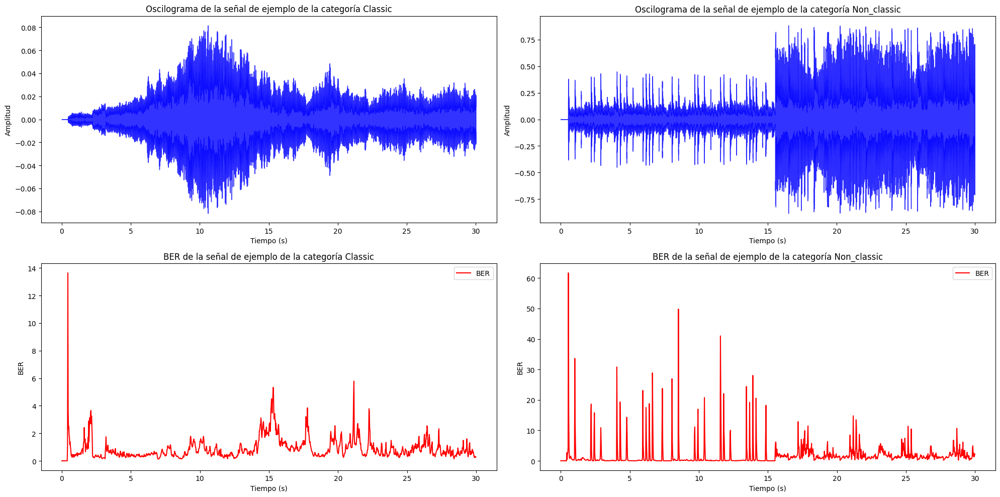

In [11]:
SPLIT_FREQ = 200
SR = 22050
FRAMES_SIZE = 1024
HOP_LENGTH = 512

fig, ax = plt.subplots(2, 2, figsize=(20, 10))

for i, (file, label) in enumerate(audios_ejemplo_jerarquia1):

    signal, sr = librosa.load(file, sr=None, mono=True)
    ber_spec = calculate_ber(signal, SPLIT_FREQ, SR, FRAMES_SIZE, HOP_LENGTH)
    frames = range(0, len(ber_spec))
    t = librosa.frames_to_time(frames, hop_length=HOP_LENGTH, sr=SR)

    # Oscillogram
    librosa.display.waveshow(signal, sr=SR, alpha=0.8, color="b", ax=ax[0, i])
    ax[0, i].set_title(f"Oscilograma de la señal de ejemplo de la categoría {label}")
    ax[0, i].set_xlabel("Tiempo (s)")
    ax[0, i].set_ylabel("Amplitud")

    # BER
    ax[1, i].plot(t, ber_spec, color="red", label="BER")
    ax[1, i].set_title(f"BER de la señal de ejemplo de la categoría {label}")
    ax[1, i].set_xlabel("Tiempo (s)")
    ax[1, i].set_ylabel("BER")
    ax[1, i].legend()

plt.tight_layout()
plt.show()


* **Spectral Centroid (SC)**

    - Intuitivamente, el centroide espectral representa el "centro de gravedad" de la distribución de frecuencias, es decir, la banda de frecuencias en torno a la cual se concentra la mayor parte de la energía de la señal. 
    
    - Es útil para distinguir sonidos con distinto "brillo". Si el centroide espectral es alto, el sonido tiende a ser más brillante o agudo, mientras que si es bajo, el sonido tiende a ser más oscuro o grave.

    - Vamos a considerar una señal dividida en $T$ bloques temporales o *frames* $(k=0,\ldots,T-1)$. 
    
        Para cada *frame* podemos calcular su $SC_k$:

        1. Calculamos el numerador como la suma ponderada de las magnitudes de las frecuencias: $sum_{n=0}^{N} n \cdot m_k(n)$
        2. Calculamos el denominador como la suma de las magnitudes de las frecuencias: $\sum_{n=0}^{N} m_k(n)$
        3. Tomamos cociente: 
        $$\text{SC}_k = \frac{\sum_{n=0}^{N} n \cdot m_k(n)}{\sum_{n=0}^{N} m_k(n)}$$
        donde $k$ representa el *frame* y $m_k(n)$ es el valor de la magnitud de la frecuencia $n$ en el *frame* $k$.

        Esta ecuación se corresponde con la ecuación matemática de la esperanza/media estadística de una distribución, en este caso, la distribución de frecuencias.

In [12]:
def calculate_spectral_centroid(signal, sample_rate, frame_size=1024, hop_length=512):
    spec_centroid = librosa.feature.spectral_centroid(y=signal, 
                                                      sr=sample_rate, 
                                                      n_fft=frame_size, 
                                                      hop_length=hop_length)[0]
    return spec_centroid

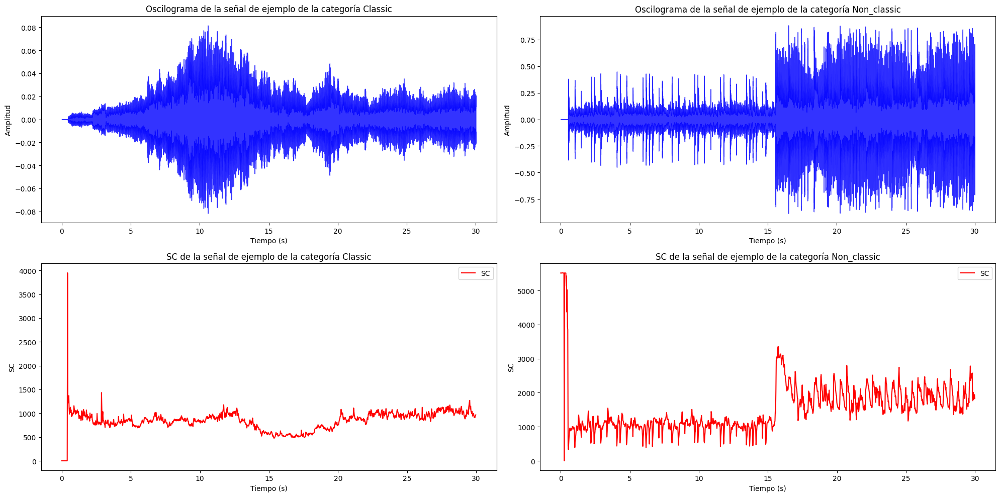

In [13]:
SPLIT_FREQ = 200
SR = 22050
FRAME_SIZE = 1024
HOP_LENGTH = 512

fig, ax = plt.subplots(2, 2, figsize=(20, 10))
for i, (file, label) in enumerate(audios_ejemplo_jerarquia1):

    signal, sr = librosa.load(file, sr=None, mono=True)
    sc_spec = calculate_spectral_centroid(signal, SR, FRAME_SIZE, HOP_LENGTH)
    frames = range(0, len(sc_spec))
    t = librosa.frames_to_time(frames, sr=SR, hop_length=HOP_LENGTH)

    # Oscillogram
    librosa.display.waveshow(signal, sr=SR, alpha=0.8, color="b", ax=ax[0, i])
    ax[0, i].set_title(f"Oscilograma de la señal de ejemplo de la categoría {label}")
    ax[0, i].set_xlabel("Tiempo (s)")
    ax[0, i].set_ylabel("Amplitud")

    # Spectral Centroid
    ax[1, i].plot(t, sc_spec, color="red", label="SC")
    ax[1, i].set_title(f"SC de la señal de ejemplo de la categoría {label}")
    ax[1, i].set_xlabel("Tiempo (s)")
    ax[1, i].set_ylabel("SC")
    ax[1, i].legend()

plt.tight_layout()
plt.show()

* **Spectral Bandwidth (SBW)**
    - Intuitivamente, el ancho de banda espectral representa la dispersión o la extensión de la distribución de frecuencias. Si el ancho de banda es alto, las frecuencias de la señal están más dispersas, mientras que si es bajo, las frecuencias están más concentradas en torno a un punto central.

    - Es útil para distinguir entre sonidos con diferentes "texturas".

    - Vamos a considerar una señal dividida en $T$ bloques temporales o *frames* $(k=0,\ldots,T-1)$.   
        Para cada *frame* podemos calcular su $SBW_k$:

        1. Calculamos el centroide espectral (SC) para el *frame* k: $\text{SC}_k = \frac{\sum_{n=0}^{N} n \cdot m_k(n)}{\sum_{n=0}^{N} m_k(n)}$
        2. Calculamos el numerador como la suma ponderada de las diferencias cuadradas de las magnitudes de las frecuencias con respecto al centroide: $\sum_{n=0}^{N} (n - \text{SC}_k)^2 \cdot m_k(n)$
        3. Calculamos el denominador como la suma de las magnitudes de las frecuencias: $\sum_{n=0}^{N} m_k(n)$
        4. Tomamos la raíz cuadrada del cociente para obtener el $SBW$ del *frame* $k$:   
        $\text{SBW}_k = \sqrt{\frac{\sum_{n=0}^{N} (n - \text{SC}_k)^2 \cdot m_k(n)}{\sum_{n=0}^{N} m_k(n)}}$

        donde $k$ representa el *frame* y $m_k(n)$ es el valor de la magnitud de la frecuencia $n$ en el *frame* $k$.

        Esta ecuación se corresponde con la ecuación matemática de la desviación estándar de una distribución, en este caso, la distribución de frecuencias.

In [14]:
def calculate_spectral_bandwidth(signal, sample_rate, frame_size=1024, hop_length=512):
    spec_bandwidth = librosa.feature.spectral_bandwidth(y=signal, sr=sample_rate, n_fft=frame_size, hop_length=hop_length)[0]
    return spec_bandwidth

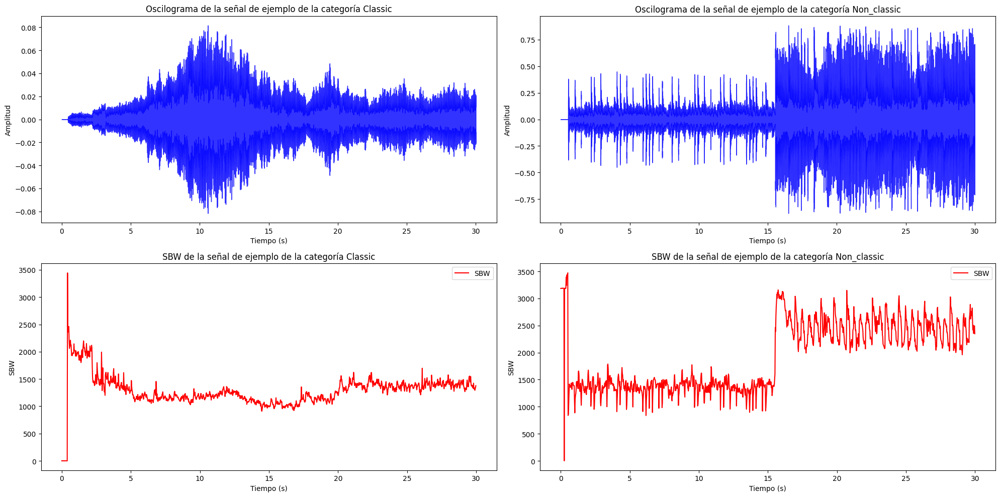

In [15]:
SR = 22050
FRAME_SIZE = 1024
HOP_LENGTH = 512

fig, ax = plt.subplots(2, 2, figsize=(20, 10))

for i, (file, label) in enumerate(audios_ejemplo_jerarquia1):
    
    signal, sr = librosa.load(file, sr=None, mono=True)
    sbw_spec = calculate_spectral_bandwidth(signal, SR, FRAME_SIZE, HOP_LENGTH)
    frames = range(0, len(sbw_spec))
    t = librosa.frames_to_time(frames, sr=SR, hop_length=HOP_LENGTH)

    # Oscillogram
    librosa.display.waveshow(signal, sr=SR, alpha=0.8, color="b", ax=ax[0, i])
    ax[0, i].set_title(f"Oscilograma de la señal de ejemplo de la categoría {label}")
    ax[0, i].set_xlabel("Tiempo (s)")
    ax[0, i].set_ylabel("Amplitud")

    # Spectral Bandwidth
    ax[1, i].plot(t, sbw_spec, color="red", label="SBW")
    ax[1, i].set_title(f"SBW de la señal de ejemplo de la categoría {label}")
    ax[1, i].set_xlabel("Tiempo (s)")
    ax[1, i].set_ylabel("SBW")
    ax[1, i].legend()

plt.tight_layout()
plt.show()

* **Chroma STFT (Short-Time Fourier Transform)**
    - El Chroma STFT es una técnica que representa la música en términos de las 12 notas de la escala cromática. 
    
    - Es especialmente útil para capturar la esencia de las dimensiones armónicas y melódicas de una pieza musical. 

    - Sea una señal segmentada en $T$ bloques temporales ($k=0,..,T-1$).  
        Para cada *frame*, calculamos su *croma*:
        1. Calculamos su Transformada de Fourier de Tiempo Corto del *frame* $X(k, \omega)$:
            $$
            X(k, \omega) = \sum_{n=0}^{N-1} s(n + kH) \cdot w(n) \cdot e^{-j \omega n}
            $$
        donde $s(i)$ es la amplitud de la señal en el instante $i$, $k$ es el índice del *frame*, $H$ es el tamaño del salto entre *frames*, $w(n)$ es la ventana de análisis, $N$ es el número de puntos en la FFT, y $\omega$ es la frecuencia angular.

        2. Mapeamos la magnitud del espectro $|X(k, \omega)|$ a las 12 clases cromáticas:
            $$
            C(k, m) = \sum_{\omega \in \text{bin}(m)} |X(k, \omega)|
            $$
        donde $m$ es el índice de una de las 12 clases cromáticas y $\text{bin}(m)$ incluye los índices de frecuencia que corresponden a la clase tonal $m$ en la escala temperada.  
        ¿Qué es lo que hace esta fórmula? Cada clase cromática $m$ corresponde a una nota musical. La fórmula $C(k, m)$ suma las energías de todas las frecuencias que caen dentro de la clase tonal y las normaliza al rango $[0,1]$. El resultado, $C(k)$, es un vector con 12 elementos. Cada elemento refleja cuánta energía hay en la señal para cada una de las 12 notas. Esto nos da una idea de qué notas son dominantes en el frame $k$.

In [16]:
def calculate_chroma_stft(signal, sample_rate, frame_size=1024, hop_length=512):
    chroma_stft = librosa.feature.chroma_stft(y=signal, sr=sample_rate, n_fft=frame_size, hop_length=hop_length)
    # Esto devuelve una matriz donde las columnas son los frames y las filas son los 12 bins de chroma
    return chroma_stft

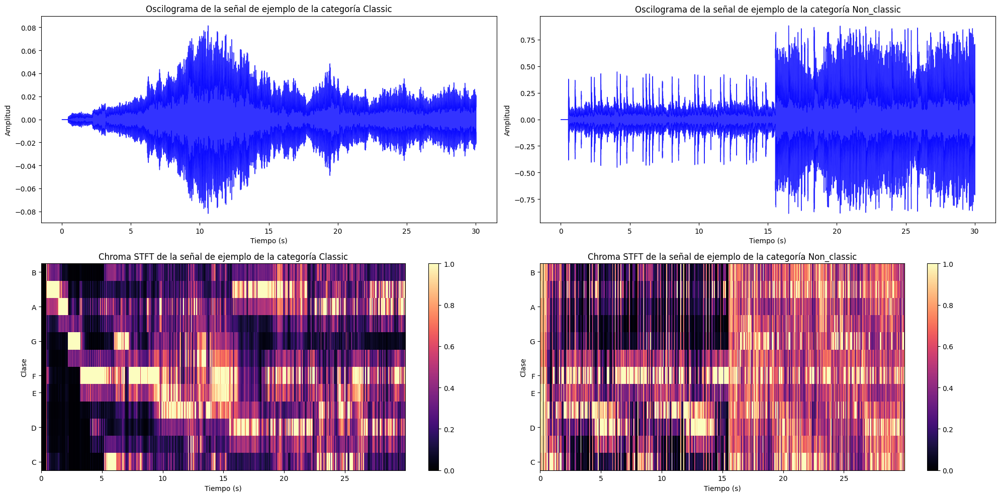

In [17]:
SR = 22050
FRAME_SIZE = 1024
HOP_LENGTH = 512

fig, ax = plt.subplots(2, 2, figsize=(20, 10))

for i, (file, label) in enumerate(audios_ejemplo_jerarquia1):
    
    signal, sr = librosa.load(file, sr=None, mono=True)
    chroma = calculate_chroma_stft(signal, SR, FRAME_SIZE, HOP_LENGTH)
    frames = range(0, len(chroma))
    t = librosa.frames_to_time(frames, sr=SR, hop_length=HOP_LENGTH)

    # Oscillogram
    librosa.display.waveshow(signal, sr=SR, alpha=0.8, color="b", ax=ax[0, i])
    ax[0, i].set_title(f"Oscilograma de la señal de ejemplo de la categoría {label}")
    ax[0, i].set_xlabel("Tiempo (s)")
    ax[0, i].set_ylabel("Amplitud")

    # Spectral Chroma STFT
    img = librosa.display.specshow(chroma, x_axis='time', y_axis='chroma', hop_length=HOP_LENGTH, sr=sr, ax=ax[1, i])
    fig.colorbar(img, ax=ax[1, i])
    ax[1, i].set_title(f"Chroma STFT de la señal de ejemplo de la categoría {label}")
    ax[1, i].set_xlabel("Tiempo (s)")
    ax[1, i].set_ylabel("Clase")

plt.tight_layout()
plt.show()

* **Spectral Rolloff**
    - El Spectral Rolloff es una medida utilizada para determinar el límite superior de las frecuencias en una señal de audio, reflejando el punto por debajo del cual se encuentra un porcentaje determinado de la energía espectral total.

    - Es especialmente útil para capturar el "brillo" de un sonido, ya que puede indicar si la mayor parte de la energía se encuentra en las frecuencias bajas o si se extiende hacia las altas.

    - Sea una señal segmentada en $T$ bloques temporales $(k=0,\ldots,T-1)$.  
        Para cada *frame*, calculamos su *rolloff*:
        1. Calculamos la Transformada de Fourier de Tiempo Corto:
            $$
            X(k, \omega) = \sum_{n=0}^{N-1} s(n + kH) \cdot w(n) \cdot e^{-j \omega n}
            $$
        donde $s(n)$ es la amplitud de la señal en el instante $n$, $k$ es el índice del *frame*, $H$ es el tamaño del salto entre *frames*, $w(n)$ es la ventana de análisis, $N$ es el número de puntos en la FFT, y $\omega$ es la frecuencia angular.

        2. Calculamos el rolloff espectral para cada *frame* como la frecuencia mínima para la cual la suma acumulada de la magnitud del espectro excede el 85% del total de la energía espectral en ese *frame*:
            $$
            R(k) = \min \left( \omega : \sum_{i=0}^{\omega} |X(k, i)| \geq 0.85 \times \sum_{i=0}^{N-1} |X(k, i)| \right)
            $$

        Esta fórmula nos da una medida que indica el punto de frecuencia por debajo del cual se concentra la mayor parte de la energía espectral. Si el rolloff es bajo, significa que la mayor parte de la energía está en las frecuencias bajas, y si es alto, significa que la energía se extiende hacia las frecuencias altas.

In [18]:
def calculate_spectral_rolloff(signal, sample_rate, frame_size=1024, hop_length=512):
    rolloff = librosa.feature.spectral_rolloff(y=signal, sr=sample_rate, n_fft=frame_size, hop_length=hop_length)[0]
    return rolloff

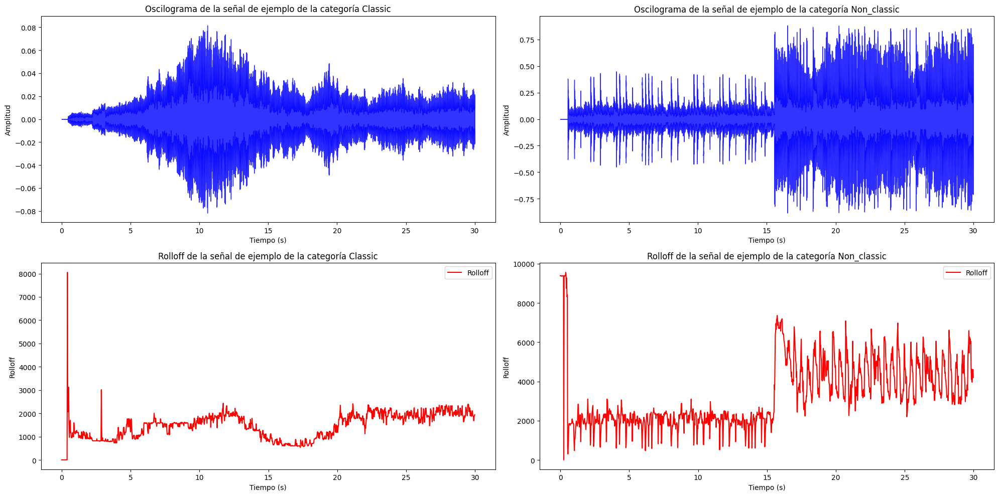

In [19]:
SR = 22050
FRAME_SIZE = 1024
HOP_LENGTH = 512

fig, ax = plt.subplots(2, 2, figsize=(20, 10))

for i, (file, label) in enumerate(audios_ejemplo_jerarquia1):
    
    signal, sr = librosa.load(file, sr=None, mono=True)
    rolloff = calculate_spectral_rolloff(signal, SR, FRAME_SIZE, HOP_LENGTH)
    frames = range(0, len(rolloff))
    t = librosa.frames_to_time(frames, sr=SR, hop_length=HOP_LENGTH)

    # Oscillogram
    librosa.display.waveshow(signal, sr=SR, alpha=0.8, color="b", ax=ax[0, i])
    ax[0, i].set_title(f"Oscilograma de la señal de ejemplo de la categoría {label}")
    ax[0, i].set_xlabel("Tiempo (s)")
    ax[0, i].set_ylabel("Amplitud")

    # Spectral Rolloff
    ax[1, i].plot(t, rolloff, color="red", label="Rolloff")
    ax[1, i].set_title(f"Rolloff de la señal de ejemplo de la categoría {label}")
    ax[1, i].set_xlabel("Tiempo (s)")
    ax[1, i].set_ylabel("Rolloff")
    ax[1, i].legend()

plt.tight_layout()
plt.show()

* **Mel Frequency Cepstral Coefficients (MFCC)**:

    - Los coeficientes de Cepstrum de Frecuencia Mel (MFCC) capturan las características espectrales de la señal basándose en la percepción auditiva humana, no simplemente en las frecuencias físicas.

    - Es especialmente útil para el reconocimiento de voz y para el análisis de audio en general.

    - Consideremos una señal segmentada en *frames* $k=0, ..., T-1$. 
        Para cada *frame*:

        1. Cálculo de Transformada de Fourier de tiempo corto (STFT):
            $$
            X(k, \omega) = \sum_{n=0}^{N-1} s_k(n) \cdot e^{-j \omega n}
            $$
            donde $X(k, \omega)$ es el espectro del *frame* $k$ y $\omega$ representa las frecuencias analizadas.

        2. Filtrado en la Escala Mel: utilizamos bancos de filtros Mel para capturar las características relevantes según la percepción auditiva humana. Estos filtros están distribuidos logarítmicamente para imitar la percepción del oído humano.
            $$
            M(k, m) = \sum_{\omega=0}^{N-1} |X(k, \omega)| \cdot H_m(\omega)
            $$
            donde $M(k, m)$ es la energía del *frame* $k$ en el filtro Mel $m$, y $H_m(\omega)$ es el filtro Mel aplicado a la frecuencia $\omega$.

        4. Cálculo de los Coeficientes Cepstrales: Calculamos el logaritmo de cada energía de banda Mel, y luego aplicamos la Transformada Discreta de Coseno (DCT) para obtener los coeficientes cepstrales que son los MFCC:
            $$   
            MFCC(k, c) = \text{DCT} \left( \log(M(k, m)) \right) = \sum_{m=0}^{M-1} \log(M(k, m)) \cdot \cos\left(\frac{\pi c (2m+1)}{2M}\right)
            $$   
            donde $MFCC(k, c)$ son los coeficientes MFCC del *frame* $k$ para el coeficiente $c$, y $M$ es el número total de filtros Mel.

In [20]:
def calculate_mfccs(signal, sample_rate, n_mfcc=13, frame_size=1024, hop_length=512):
    mfcc = librosa.feature.mfcc(y=signal, sr=sample_rate, n_mfcc=n_mfcc, n_fft=frame_size, hop_length=hop_length)
    # Esto devuelve una matriz donde las columnas son los frames y las filas son los coeficientes MFCC
    return mfcc

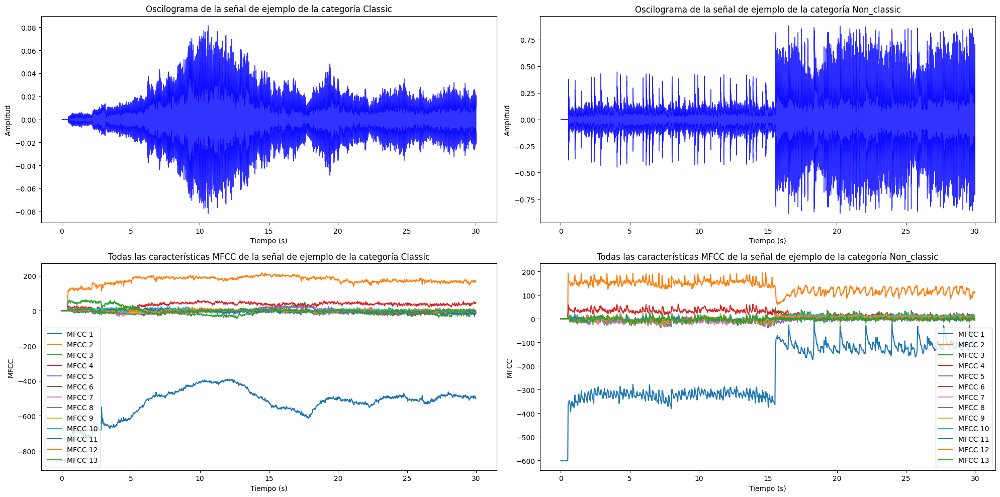

In [21]:
SR = 22050
FRAME_SIZE = 1024
HOP_LENGTH = 512

fig, ax = plt.subplots(2, 2, figsize=(20, 10))

for i, (file, label) in enumerate(audios_ejemplo_jerarquia1):
    
    signal, sr = librosa.load(file, sr=None, mono=True)
    mfccs = calculate_mfccs(signal, sr, n_mfcc=13, frame_size=FRAME_SIZE, hop_length=HOP_LENGTH)
    mfcc_1 = mfccs[0]  # Primera característica de MFCC
    frames = range(len(mfcc_1))
    t = librosa.frames_to_time(frames, sr=sr, hop_length=HOP_LENGTH)

    # Oscillogram
    librosa.display.waveshow(signal, sr=SR, alpha=0.8, color="b", ax=ax[0, i])
    ax[0, i].set_title(f"Oscilograma de la señal de ejemplo de la categoría {label}")
    ax[0, i].set_xlabel("Tiempo (s)")
    ax[0, i].set_ylabel("Amplitud")

    # Plot all MFCCs
    for j in range(mfccs.shape[0]):
        ax[1, i].plot(t, mfccs[j], label=f"MFCC {j+1}")
    ax[1, i].set_title(f"Todas las características MFCC de la señal de ejemplo de la categoría {label}")
    ax[1, i].set_xlabel("Tiempo (s)")
    ax[1, i].set_ylabel("MFCC")
    ax[1, i].legend()

plt.tight_layout()
plt.show()

____

## 2.3. Extracción de características para el dataset CCMUSIC

En la actualidad es muy común el uso de espectrogramas junto con redes convolucionales CNN para realizar clasificación de audio. No obstante, tradicionalmente, para entrenar modelos clásicos de Machine Learning se utilizaba extracción de características. Al igual que en el caso del análisis de textos se utilizada el TfIdf junto con SVM ("bag of words"), en el análisis de audio se identificaba cada audio con una serie de características y se construía un dataset tabular (de ahí que hayamos titulado este proyecto "bag of songs").

En esta sección, vamos a extraer las características anteriores para cada audio y vamos a construir un dataset tabular que nos permita clasificar utilizando modelos clásicos y datos tabulares. Para ello vamos a utilizar una aproximación muy frecuente en la literatura. Para cada característica pese a ser una serie de valores (debido a la segmentación en frames de la señal) almacenaremos un único valor tabular (para el chroma almacenaremos una característica por cada tono y en los coeficientes de mel una característica por cada coeficiente), en este caso utilizaremos la media. Esta aproximación pese a parecer *naive* reduce considerablemente el número de características y simplifica considerablemente tanto la complejidad del modelo como los costes computacionales. Además esto lo conseguimos sin sacrificar eficiencia como veremos más adelante en el siguiente notebook. Esto pone el foco en la importancia de decidir adecuadamente el modelo y los datos a utilizar en función de la complejidad de la tarea y no recurrir siempre a modelos muy potentes pero costosos computacionalmente y que además con pocos datos pueden no dar buenos resultados.

<img src="img/NB2_featuresDataset.jpeg" width="600"/>

*Figura: Generación de corpus de características. Fuente:* [[4]](https://www.sciencedirect.com/topics/engineering/audio-feature)

Giannakopoulos, Theodoros, and Aggelos Pikrakis. "Chapter 4 - Audio Features." In Introduction to Audio Analysis, edited by Theodoros Giannakopoulos and Aggelos Pikrakis, 59-103. Academic Press, 2014.

In [25]:
def store_features(audio_path, label, csv_file):
    audio_data, sr = librosa.load(audio_path, sr=None)

    # Características del dominio temporal    
    envelope = amplitude_envelope(audio_data)
    rms = calculate_rms(audio_data)
    zcr = calculate_zcr(audio_data)
    ber = calculate_ber(audio_data, 500, sr)

    # Características del dominio frecuencial    
    spec_cent = calculate_spectral_centroid(audio_data, sr)
    spec_bw = calculate_spectral_bandwidth(audio_data, sr)
    rolloff = calculate_spectral_rolloff(audio_data, sr)
    chroma_stft = calculate_chroma_stft(audio_data, sr)
    mfcc = calculate_mfccs(audio_data, sr, n_mfcc=13)

    features = [np.mean(envelope), np.mean(rms), np.mean(zcr), np.mean(ber), np.mean(spec_cent),
                np.mean(spec_bw), np.mean(rolloff)] + np.mean(chroma_stft, axis=1).tolist() + np.mean(mfcc, axis=1).tolist()
    
    with open(csv_file, 'a') as f:
        row = f"{audio_path},{label}," + ",".join(map(str, features))
        f.write(row + "\n")

In [26]:
def process_corpus(corpus_folder):

    for partition in ["train", "validation", "test"]:

        # Crear fichero de características
        features_path = f"{corpus_folder}/{partition}/features.csv"
        with open(features_path, 'w') as f:
            headers = ["audio_file", "label", "mean_envelope", "mean_rms", "mean_zcr",
                       "mean_ber", "mean_spec_cent", "mean_spec_bw", "mean_rolloff"] 
            header_chroma = [f"mean_chroma_stft{i}" for i in ["C", "C#", "D", "D#", "E", "F", "F#", "G", "G#", "A", "A#", "B"]]
            header_mfcc = [f"mean_mfcc{i+1}" for i in range(13)] 
            headers += header_chroma + header_mfcc
            f.write(",".join(headers) + "\n")

        # Extraer características de cada audio
        annotations_path = f"{corpus_folder}/{partition}/annotations.csv"
        annotations = pd.read_csv(annotations_path)
        for _, row in annotations.iterrows():
            audio_file = row['audio_file']
            label = row['label_id']
            store_features(audio_file, label, features_path)

In [27]:
process_corpus('ccmusic')

In [ ]:
process_corpus('ccmusic2')

*Observación: la celda anterior tarda bastante tiempo en ejecutar, debido al elevado tamaño del dataset (aproximadamente 1 hora cada una), por lo que se recomienda no ejecutarla a menos que cuente con tiempo suficiente. Alternativamente, puede proceder a visualizar las salidas del presente notebook ya ejecutadas.*

Mostramos a continuación el resultado de las características generadas para el corpus CCMUSIC en su partición de entrenamiento:

In [3]:
with open("./ccmusic/train/features.csv", newline="") as csvfile:
    csvreader = csv.reader(csvfile)

    for i, row in enumerate(csvreader):
        if i >= 4:
            break
        print(row)

['audio_file', 'label', 'mean_envelope', 'mean_rms', 'mean_zcr', 'mean_ber', 'mean_spec_cent', 'mean_spec_bw', 'mean_rolloff', 'mean_chroma_stftC', 'mean_chroma_stftC#', 'mean_chroma_stftD', 'mean_chroma_stftD#', 'mean_chroma_stftE', 'mean_chroma_stftF', 'mean_chroma_stftF#', 'mean_chroma_stftG', 'mean_chroma_stftG#', 'mean_chroma_stftA', 'mean_chroma_stftA#', 'mean_chroma_stftB', 'mean_mfcc1', 'mean_mfcc2', 'mean_mfcc3', 'mean_mfcc4', 'mean_mfcc5', 'mean_mfcc6', 'mean_mfcc7', 'mean_mfcc8', 'mean_mfcc9', 'mean_mfcc10', 'mean_mfcc11', 'mean_mfcc12', 'mean_mfcc13']
['ccmusic/train/audios/audio_train_0.wav', '1', '0.11834209', '0.043626927', '0.06029441998839', '4.037650406425431', '1350.649028619625', '1758.8288562356815', '2675.950485560178', '0.3037986755371094', '0.4709104597568512', '0.3970898687839508', '0.3905490636825561', '0.6096645593643188', '0.3400802314281463', '0.2638729214668274', '0.2332472950220108', '0.4476198852062225', '0.4777764976024627', '0.2827644348144531', '0.312

____

## 2.4. Caso práctico: las características distinguen géneros muscicales

En esta sección, exploraremos cómo diferentes características extraídas de señales de audio pueden ayudar a distinguir entre géneros musicales. Para ello, trabajaremos con las características extraídas para el conjunto de datos CCMUSIC analizando la distinción entre piezas clasificadas en dos géneros: clásico y no clásico. En primer lugar, procederemos a la carga del dataframe de características que hemos generado utilizando `pandas` para facilitar la generación y tratamiento de los gráficos comparativos.

In [47]:
ccmusic_train_df = pd.read_csv("./ccmusic/train/features.csv")
ccmusic_train_df['label'] = ccmusic_train_df['label'].map({0: "Classic", 1: "Non_classic"})
ccmusic_train_df.head()

,audio_file,label,mean_envelope,mean_rms,mean_zcr,mean_ber,mean_spec_cent,mean_spec_bw,mean_rolloff,mean_chroma_stftC,...,mean_mfcc4,mean_mfcc5,mean_mfcc6,mean_mfcc7,mean_mfcc8,mean_mfcc9,mean_mfcc10,mean_mfcc11,mean_mfcc12,mean_mfcc13
0,ccmusic/train/audios/audio_train_0.wav,Non_classic,0.118342,0.043627,0.060294,4.037650,1350.649029,1758.828856,2675.950486,0.303799,...,14.262732,-9.834314,1.234797,-8.568365,-2.967585,-3.155700,2.821059,-5.118351,-7.059968,-7.387438
1,ccmusic/train/audios/audio_train_1.wav,Non_classic,0.314424,0.103811,0.138103,4.370842,2636.363229,2593.828616,5751.798553,0.449251,...,21.163847,-2.102902,13.158632,-2.086342,3.813090,0.176029,2.830223,-1.856849,-0.515684,-2.517826
2,ccmusic/train/audios/audio_train_2.wav,Classic,0.181952,0.065241,0.090361,1.856970,1452.552736,1590.335734,2817.732962,0.370835,...,29.029503,-0.097123,7.030556,-0.122062,-0.914543,-7.689175,2.216881,-5.035603,-0.881421,-4.491457
3,ccmusic/train/audios/audio_train_3.wav,Non_classic,0.163407,0.063564,0.090101,6.817037,1675.637336,1715.368994,3338.713145,0.240659,...,1.358353,-3.658217,-9.264130,-13.727772,-7.359771,-16.555607,-7.142061,-12.954017,-9.500304,-9.483947
4,ccmusic/train/audios/audio_train_4.wav,Non_classic,0.348335,0.128825,0.100390,17.659496,2222.363681,2569.843206,4858.120624,0.570061,...,20.203270,12.056563,12.802843,5.485869,7.783658,-6.393661,-4.450887,-0.254011,1.553904,-2.201432


### 2.4.1. Estudio comparativo de géneros utilizando las características y boxplots

Utilizaremos gráficos de boxplot para visualizar la distribución de estas características, lo que nos permitirá observar cómo difieren entre las dos categorías. Pese a que es bien conocido, introduciremos brevemente lo que es un boxplot. Un boxplot, o diagrama de caja y bigotes, es una representación gráfica que nos permite visualizar la distribución de un conjunto de datos. Muestra información útil como la mediana, los cuartiles, los valores atípicos y la dispersión de los datos. Los boxplots son especialmente útiles para comparar la distribución de una variable continua en función de diferentes categorías o grupos.

<img src="img/NB2_boxplot.png" width="600"/>

*Figura: Explicación de los boxplots. Fuente:* [[3]](https://datatab.net/tutorial/box-plot)

In [48]:
def representa_boxplot(datos, columna_caracteristica, columna_categoria):
    plt.figure(figsize=(10, 6))
    sns.boxplot(x=columna_categoria, y=columna_caracteristica, data=datos)
    plt.title(f"Distribución de la característica {columna_caracteristica} por categoría {columna_categoria}")
    plt.show()

def representa_boxplots_subplots(df, feature_prefix, feature_list, label, n_cols=3):
    n_plots = len(feature_list)
    n_rows = -(-n_plots // n_cols)
    
    fig, axs = plt.subplots(n_rows, n_cols, figsize=(20, 10))
    fig.subplots_adjust(hspace=0.4, wspace=0.4)

    for i, t in enumerate(feature_list):
        ax = axs[i // n_cols, i % n_cols]
        sns.boxplot(x=label, y=f"{feature_prefix}{t}", data=df, ax=ax)
        ax.set_title(f"Boxplot of {feature_prefix}{t} by {label}")

    for j in range(i + 1, n_rows * n_cols):
        fig.delaxes(axs[j // n_cols, j % n_cols])

    plt.show()

def remove_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

def representa_boxplot_sin_outliers(datos, columna_caracteristica, columna_categoria):
    datos_sin_outliers = remove_outliers(datos, columna_caracteristica)
    plt.figure(figsize=(10, 6))
    sns.boxplot(x=columna_categoria, y=columna_caracteristica, data=datos_sin_outliers)
    plt.title(f"Distribución de la característica {columna_caracteristica} sin outliers por categoría {columna_categoria}")
    plt.show()

Exploraremos características tanto en el dominio temporal (envolvente, RMS, tasa de cruce por cero) como en el dominio frecuencial (proporción de energía de la banda, centroides espectrales, ancho de banda espectral, roll-off espectral, características de chroma y coeficientes MFCC). La visualización de boxplots segmentados por categoría (género músical) nos proporcionan *insights* interesantes y nos darán una idea clara de qué características son útiles para distinguir entre géneros musicales y cuáles proporcionan una diferencia clara entre las distintas categorías (y por qué).

* **Dominio temporal - Envolvente.** La característica *mean_envelope* parece ser mayor en el género Non_classic, lo que indica que las canciones de música no clásica tienden a tener una envolvente de mayor amplitud. Esto es razonable, ya que el género no clásico puede incluir géneros musicales con sonidos más variados y dinámicos, como el pop o el rock, que suelen tener cambios de amplitud más pronunciados en comparación con la música clásica, que puede ser más suave y controlada. Las cajas del boxplot no se solapan, lo que indica que la característica *mean_envelope* es bastante efectiva para distinguir entre los dos géneros.

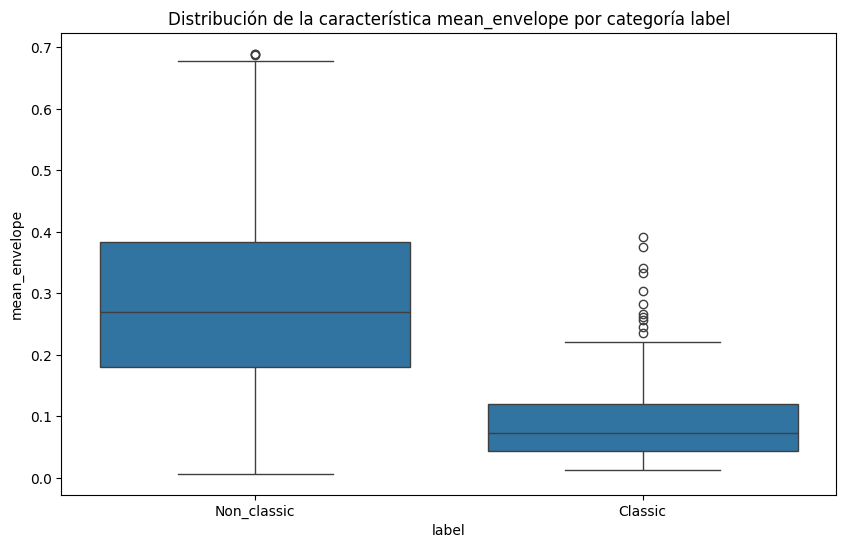

In [49]:
representa_boxplot(ccmusic_train_df, "mean_envelope", "label")

* **Dominio temporal - Root Mean Square y Zero Crossing Rate.** Las distribuciones de las características mean_rms y zero crossing rate muestran diferencias notables entre la música clásica y la no clásica, indicando que estas características son relevantes para distinguir y clasificar piezas musicales en los géneros considerados.

    La característica mean_zcr tiende a ser más alta en el género Non_classic, lo que indica que las canciones de música no clásica tienden a tener más cruces del eje cero. Además, presenta varios outliers en el extremo superior, lo que indica que algunas canciones de música no clásica tienen tasas de cruce por cero significativamente más altas que la media, probablemente debido a la presencia de géneros como el rock o el pop en el dataset. 
    
    Esta tendencia puede ser el resultado de que las canciones de música no clásica suelen tener contenido de frecuencias más altas, lo que implica cambios rápidos en la amplitud, típicos de sonidos como platillos o guitarras eléctricas distorsionadas. Además, la música no clásica es más dinámica y caótica, mientras que la música clásica tiene sonidos más armoniosos y cuidados.

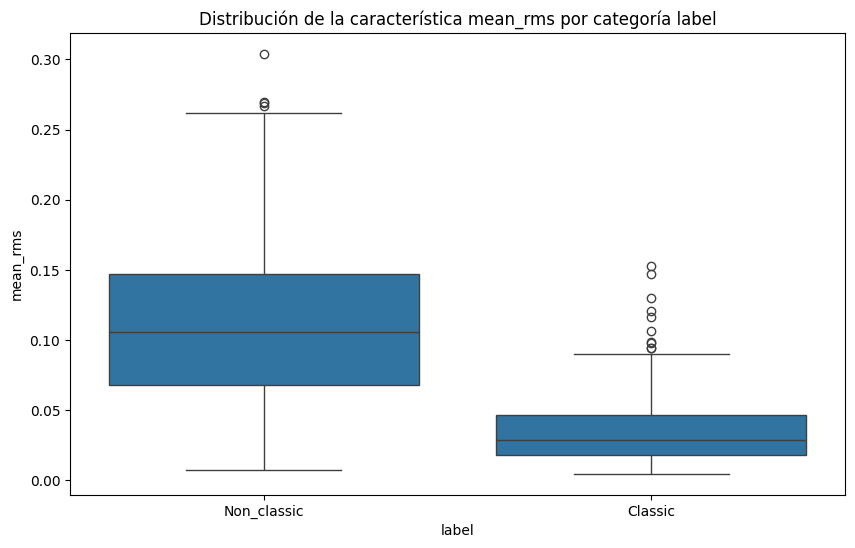

In [50]:
representa_boxplot(ccmusic_train_df, "mean_rms", "label")

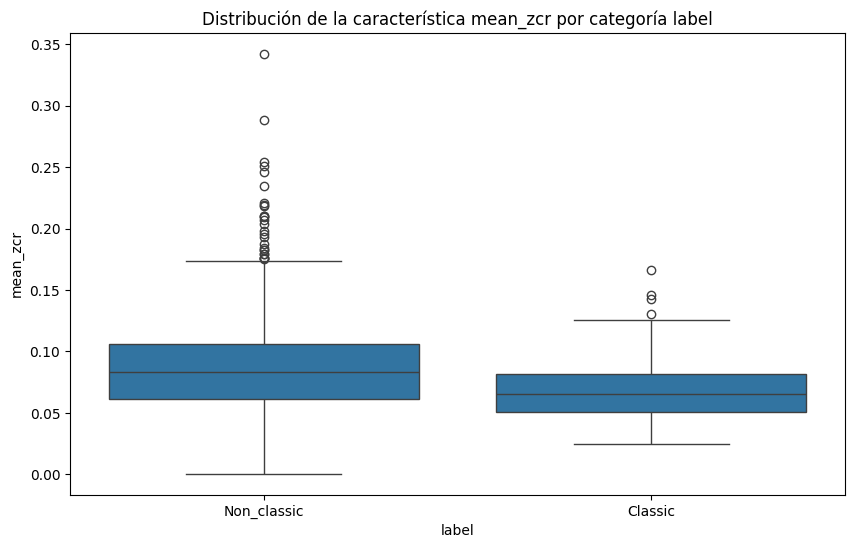

In [51]:
representa_boxplot(ccmusic_train_df, "mean_zcr", "label")

De hecho si utilizamos las características generadas para el mismo dataset pero con las categorías más desglosadas (sinfonía, opera, solo, cámara, pop, dance, indie, soul y rock) observamos que la tasa media de cruce del cero en los géneros de música clásica (como sinfonía, solo o música de cámara) tiende a ser más bajo que en los géneros de música no clásica (como dance o pop).

In [52]:
ccmusic2_train_df = pd.read_csv("./ccmusic2/train/features.csv")
ccmusic2_train_df['label'] = ccmusic2_train_df['label'].map({
    0: "Symphony",
    1: "Opera",
    2: "Solo",
    3: "Chamber",
    4: "Pop",
    5: "Dance_and_house",
    6: "Indie",
    7: "Soul_or_r_and_b",
    8: "Rock"
})
ccmusic2_train_df.head()

,audio_file,label,mean_envelope,mean_rms,mean_zcr,mean_ber,mean_spec_cent,mean_spec_bw,mean_rolloff,mean_chroma_stftC,...,mean_mfcc4,mean_mfcc5,mean_mfcc6,mean_mfcc7,mean_mfcc8,mean_mfcc9,mean_mfcc10,mean_mfcc11,mean_mfcc12,mean_mfcc13
0,ccmusic2/train/audios/audio_train_0.wav,Rock,0.118342,0.043627,0.060294,4.037650,1350.649029,1758.828856,2675.950486,0.303799,...,14.262732,-9.834314,1.234797,-8.568365,-2.967585,-3.155700,2.821059,-5.118351,-7.059968,-7.387438
1,ccmusic2/train/audios/audio_train_1.wav,Soul_or_r_and_b,0.314424,0.103811,0.138103,4.370842,2636.363229,2593.828616,5751.798553,0.449251,...,21.163847,-2.102902,13.158632,-2.086342,3.813090,0.176029,2.830223,-1.856849,-0.515684,-2.517826
2,ccmusic2/train/audios/audio_train_2.wav,Symphony,0.181952,0.065241,0.090361,1.856970,1452.552736,1590.335734,2817.732962,0.370835,...,29.029503,-0.097123,7.030556,-0.122062,-0.914543,-7.689175,2.216881,-5.035603,-0.881421,-4.491457
3,ccmusic2/train/audios/audio_train_3.wav,Dance_and_house,0.163407,0.063564,0.090101,6.817037,1675.637336,1715.368994,3338.713145,0.240659,...,1.358353,-3.658217,-9.264130,-13.727772,-7.359771,-16.555607,-7.142061,-12.954017,-9.500304,-9.483947
4,ccmusic2/train/audios/audio_train_4.wav,Soul_or_r_and_b,0.348335,0.128825,0.100390,17.659496,2222.363681,2569.843206,4858.120624,0.570061,...,20.203270,12.056563,12.802843,5.485869,7.783658,-6.393661,-4.450887,-0.254011,1.553904,-2.201432


In [53]:
mean_zcr_by_label = ccmusic2_train_df.groupby('label')['mean_zcr'].mean()

mean_zcr_by_label_sorted = mean_zcr_by_label.sort_values(ascending=False)

for label, mean_zcr in mean_zcr_by_label_sorted.items():
    print(f"La categoría '{label}' tiene un mean_zcr medio de {mean_zcr:.4f}.")

La categoría 'Dance_and_house' tiene un mean_zcr medio de 0.1112.
La categoría 'Soul_or_r_and_b' tiene un mean_zcr medio de 0.0958.
La categoría 'Pop' tiene un mean_zcr medio de 0.0867.
La categoría 'Opera' tiene un mean_zcr medio de 0.0846.
La categoría 'Rock' tiene un mean_zcr medio de 0.0803.
La categoría 'Indie' tiene un mean_zcr medio de 0.0742.
La categoría 'Chamber' tiene un mean_zcr medio de 0.0679.
La categoría 'Symphony' tiene un mean_zcr medio de 0.0676.
La categoría 'Solo' tiene un mean_zcr medio de 0.0522.


* **Dominio frecuencial - Spectral Centroid.** El spectral centroid mide el centro de masa del espectro de frecuencias. En el gráfico, podemos ver que los valores de *mean_spec_cent* son generalmente más altos para el género Non_classic en comparación con Classic. Esto indica que las canciones de música no clásica tienden a tener más contenido de altas frecuencias, lo que es típico de géneros como el pop o el rock, que suelen tener sonidos más agudos y brillantes. 

    No vemos a penas solapamiento de rangos intercuartílicos lo que denota que esta característica puede ser bastante útil en la distinción de los géneros músicales aplicados a nuestro dataset.

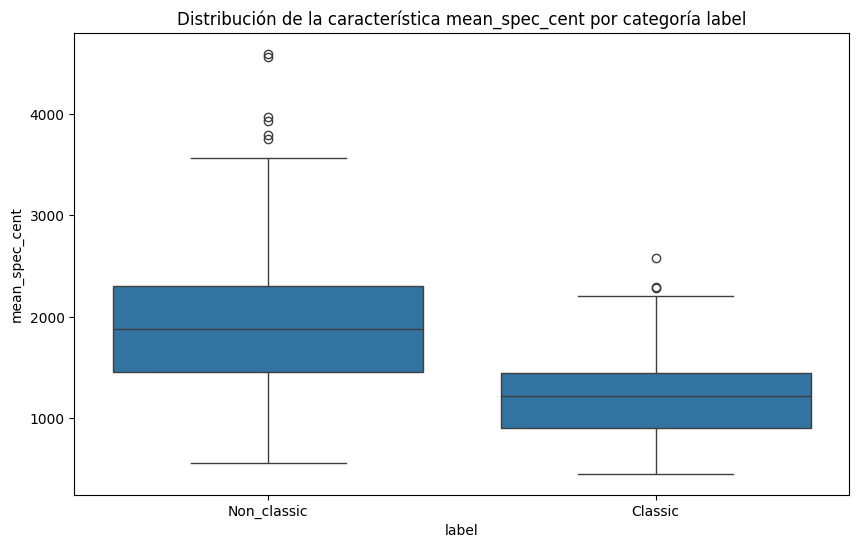

In [54]:
representa_boxplot(ccmusic_train_df, "mean_spec_cent", "label")

* **Dominio frecuencial - Spectral Bandwidth, Spectral Rolloff.** En el caso del *spectral bandwidth* y *spectral rolloff* también podemos visualizar diferencias notorias entre ambos géneros (música clásica y no clásica), al no haber solapamiento de las cajas. 

    En el caso del *band energy ratio*, en el primer gráfico, la característica *mean_ber* presenta varios outliers con valores muy altos en ambas categorías, lo que afecta la capacidad de interpretar correctamente el gráfico y comparar las categorías. Al eliminar los outliers tenemos una vista más clara de lo que está sucediendo. Hay cierto solapamiento de las cajas, por lo que en esta característica no podemos apreciar de forma tan clara una diferencia entre ambos géneros. 
    
    Igualmente podría analizarse la conexión con la realidad que tienen estas tendencias diferenciadas pero lo que queda claro es la utilidad de estas características para clasificar audios utilizando modelos de Machine Learning, como procederemos en la próxima sección/notebook.

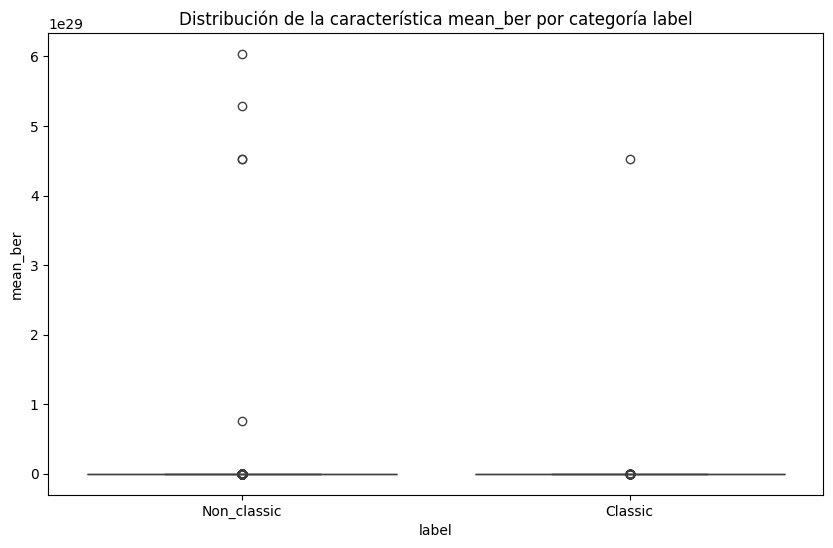

In [55]:
representa_boxplot(ccmusic_train_df, "mean_ber", "label")

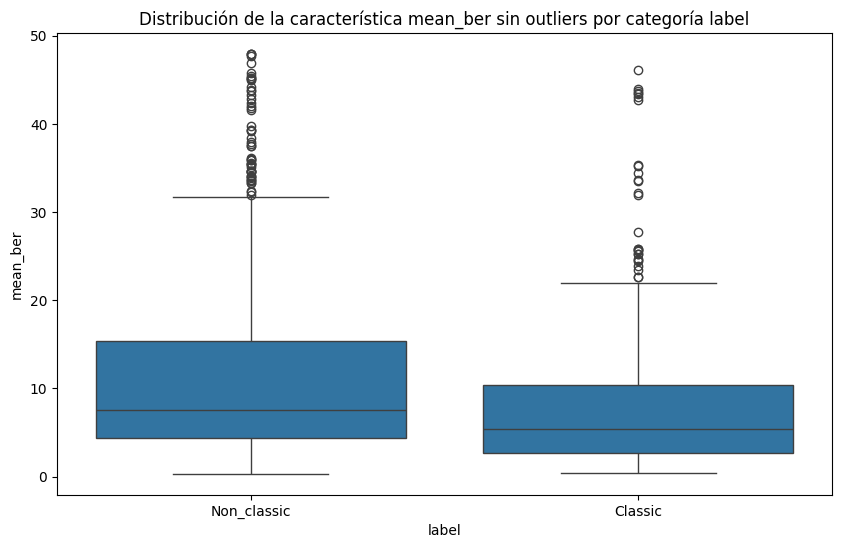

In [56]:
representa_boxplot_sin_outliers(ccmusic_train_df, "mean_ber", "label")

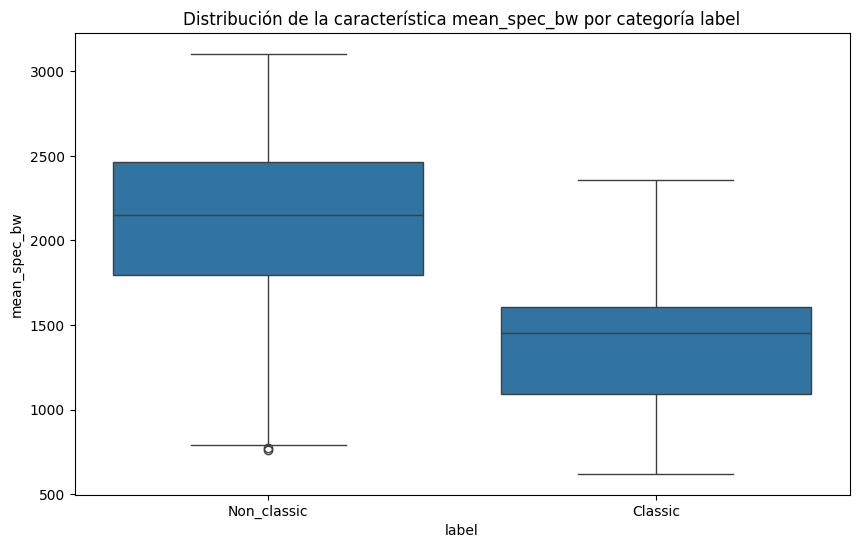

In [57]:
representa_boxplot(ccmusic_train_df, "mean_spec_bw", "label")

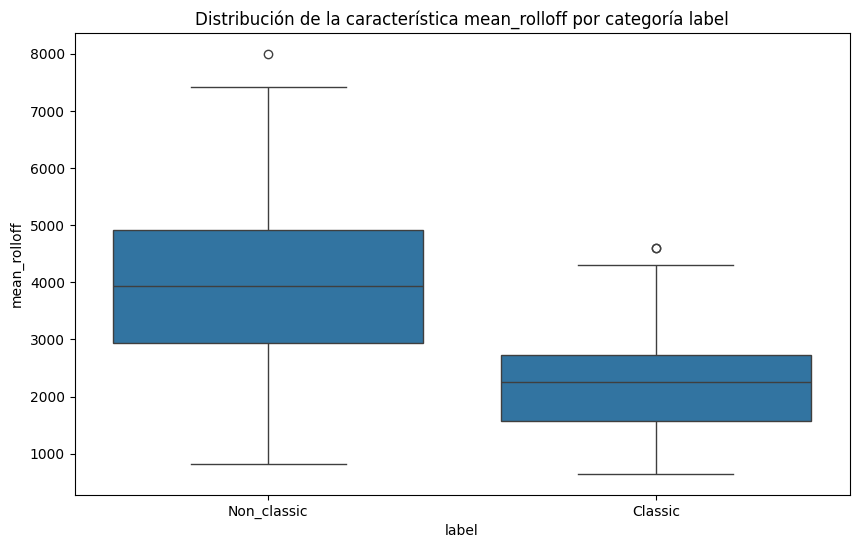

In [58]:
representa_boxplot(ccmusic_train_df, "mean_rolloff", "label")

* **Dominio frecuencial - Chroma y Mel-frequency cepstral coefficients.** Para estas características extraídas de los audios, no hemos creado una única columna en nuestro conjunto de datos. Para estas características extraídas de los audios, no hemos creado una única columna en nuestro conjunto de datos. En el caso de las características Chroma y MFCCs, hemos generado múltiples columnas, cada una representando un tono (en el caso de Chroma) o un coeficiente (en el caso de MFCCs). Los boxplot evidencian diferencias en la mayoría de los casos.

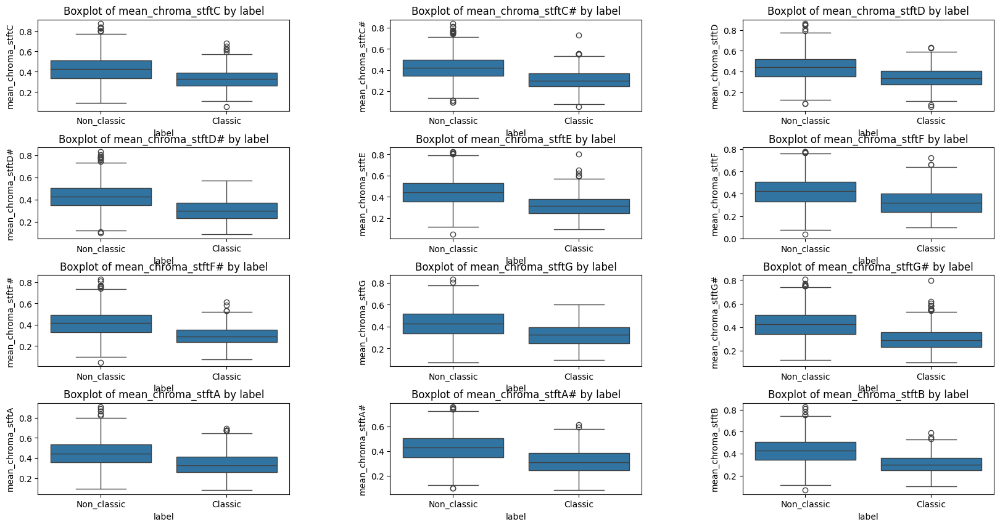

In [59]:
notes = ["C", "C#", "D", "D#", "E", "F", "F#", "G", "G#", "A", "A#", "B"]
representa_boxplots_subplots(ccmusic_train_df, "mean_chroma_stft", notes, "label")

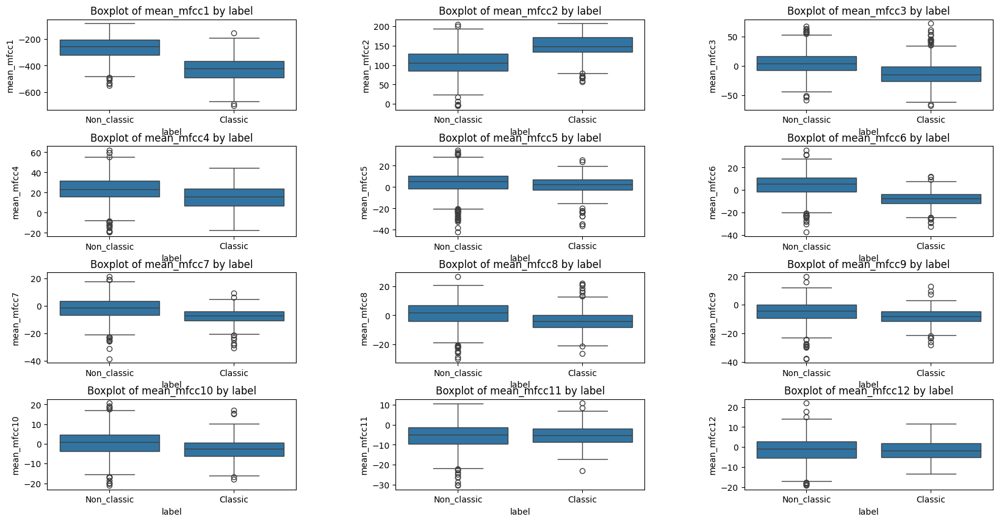

In [60]:
tones = range(1,13)
representa_boxplots_subplots(ccmusic_train_df, "mean_mfcc", tones, "label")

### 2.4.2. Análisis de importancia de características y correlaciones de características con la etiqueta

Usaremos el coeficiente para analizar la importancia de las diferentes características en relación a la clasificación de los géneros musicales. El coeficiente de correlación es un valor que indica el grado en el que dos variables están linealmente relacionadas. Los coeficientes de correlación van de -1 a 1, donde 1 indica una correlación positiva perfecta, -1 indica una correlación negativa perfecta, y 0 indica que no hay correlación. El coeficiente de correlación lineal entre dos variables $X$ e $Y$ se puede expresar como:

$$
\text{Correlación}(X, Y) = \frac{\sum_{i=1}^n \left( X_i - \bar{X} \right) \left( Y_i - \bar{Y} \right)}{\sqrt{\sum_{i=1}^n \left( X_i - \bar{X} \right)^2} \sqrt{\sum_{i=1}^n \left( Y_i - \bar{Y} \right)^2}}
$$

donde $\bar{X}$ y $\bar{Y}$ son los valores medios de $X$ y $Y$, respectivamente, y $n$ es el número de observaciones.

En general las correlaciones que se muestran son bastante altas, lo que evidencia que las características extraídas son de gran utilidad para distinguir los géneros, como veremos en la próxima sección.

In [63]:
df = ccmusic_train_df.drop(['audio_file'], axis=1)
df['label'] = df['label'].map({"Classic": 0, "Non_classic": 1})

correlation_matrix = df.corr()
correlation_with_label = correlation_matrix['label'].sort_values(ascending=False)
correlation_with_label = correlation_with_label[1:]
print(correlation_with_label)

mean_mfcc1            0.643750
mean_spec_bw          0.600122
mean_rms              0.553915
mean_envelope         0.552153
mean_rolloff          0.518297
mean_mfcc6            0.497608
mean_spec_cent        0.474013
mean_chroma_stftD#    0.426782
mean_chroma_stftB     0.417721
mean_chroma_stftC#    0.412309
mean_chroma_stftG#    0.407808
mean_chroma_stftF#    0.404016
mean_chroma_stftE     0.390584
mean_chroma_stftA#    0.384640
mean_chroma_stftG     0.341263
mean_chroma_stftD     0.330628
mean_mfcc7            0.329674
mean_chroma_stftA     0.326979
mean_chroma_stftF     0.325028
mean_chroma_stftC     0.316274
mean_mfcc3            0.314112
mean_mfcc4            0.268531
mean_mfcc8            0.242346
mean_zcr              0.237076
mean_mfcc10           0.215720
mean_mfcc9            0.206357
mean_mfcc5            0.107360
mean_mfcc12           0.025786
mean_ber              0.009207
mean_mfcc11          -0.028430
mean_mfcc13          -0.233100
mean_mfcc2           -0.509300
Name: la

Las características más relevantes son aquellas con mayor correlación lineal en valor absoluto, entre ellas destacan algunos coeficiente de mel, el ancho de banda espectral, la raíz cuadrada media, la envolvente y el rollof.

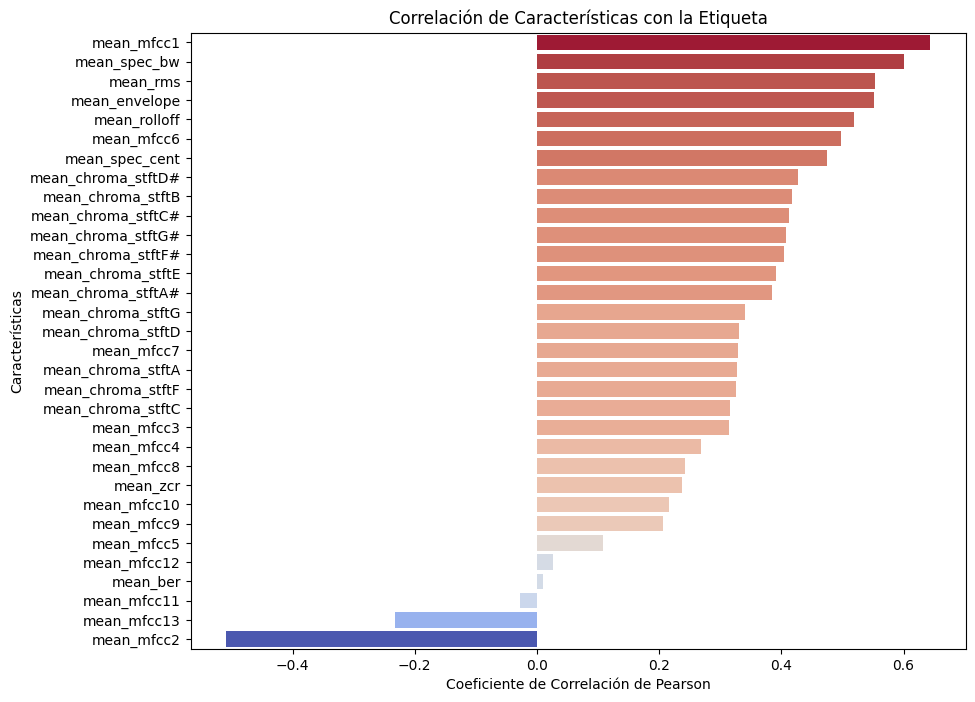

In [67]:
df_correlation = pd.DataFrame({'Feature': correlation_with_label.index, 'Correlation': correlation_with_label.values})

plt.figure(figsize=(10, 8))
sns.barplot(data=df_correlation, x='Correlation', y='Feature', hue='Correlation', dodge=False, palette='coolwarm')
plt.title("Correlación de Características con la Etiqueta")
plt.xlabel("Coeficiente de Correlación de Pearson")
plt.ylabel("Características")
plt.legend().remove()
plt.show()

____